# 🐶 End to End multi-class dog breed classification

This notebook builds an end-to-end multi image classification of dog breed using Tensorflow 2.0 and Tensorflow hub.


## 1. Problem

Identifying a dog breed given an image
## 2. Data
The date we are using is from kaggle
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data

* There are 120 breeds of dogs in this dataset which means 120 different classes

* There are around 10000+ images in the training set(these images have label)

* There are around 10000+ images in the test set (these images have no label)

### Getting our workspace ready

* Import Tensorflow✅
* Import Tensorflow Hub✅
* Make sure we are using a GPU✅


In [ ]:
# !unzip "/content/drive/MyDrive/dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog vision/"

In [ ]:
# Import tensorflow into colab

import tensorflow as tf
import tensorflow_hub as hub
print("TF version :",tf.__version__)
print("TF hub version",hub.__version__)

TF version : 2.12.0
TF hub version 0.13.0


In [ ]:
# check for GPU availability

print("GPU","available Yesss" if tf.config.list_physical_devices("GPU") else "not available")

GPU available Yesss


In [ ]:
print("GPU","available Yesss" if tf.config.list_physical_devices("GPU") else "not available")

GPU available Yesss


## Getting our data ready (turning our data into tensors)

With all machine learning models , our data has to be in numerical format  . So thats what we will be doing
first. Turning our images into tensors(numerical representations arrays)


Let's start by accessing the data and checking the labels


In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/dog vision/labels.csv")
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [ ]:
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
# How many images are there for each breed ?

labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

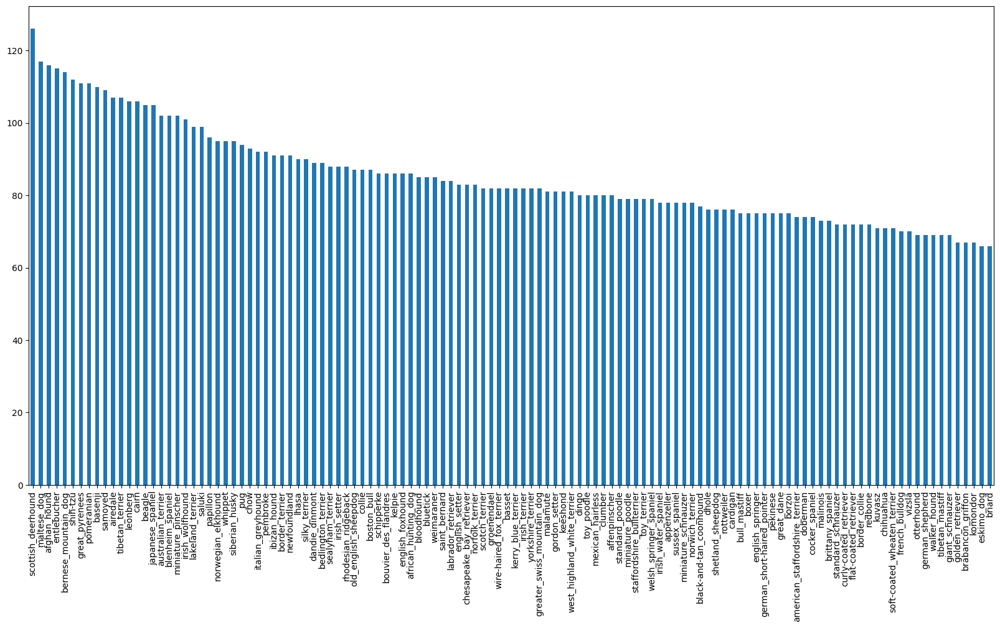

In [ ]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

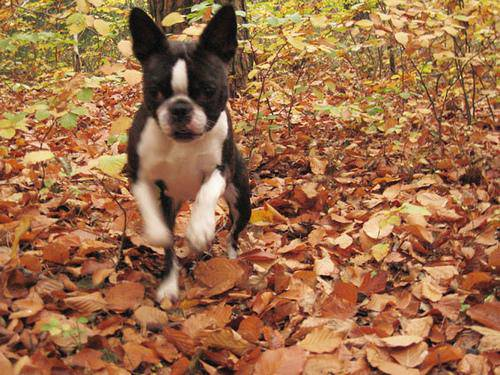

In [ ]:
# Lets view an image

from IPython.display import Image

Image('drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## Getting images and their labels

Lets get the images and their file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image id's

filenames = ["drive/MyDrive/dog vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual images files
import os

os.listdir("drive/MyDrive/dog vision/train/")[:10]

['e288a162bfb38659a7ca6809546b6dff.jpg',
 'e1d0619c08c523d87097109784a1d0dd.jpg',
 'dcfe4f0f7d7c091e8488bff8662582be.jpg',
 'e2ac9b607458c25b1422271887f27e35.jpg',
 'de2db91c990838b3951a72ad21988e31.jpg',
 'e87e709987ed707393533e9d2429f585.jpg',
 'e466e0a3b43403c7bffd943fffc92ced.jpg',
 'ded35f1917f66ed6cb3179e163406aec.jpg',
 'dfd42ce694fd4af24a71392b94176b56.jpg',
 'e3b794cfccf2ed02689f046aebe7f650.jpg']

In [ ]:
if len(os.listdir("drive/MyDrive/dog vision/train/"))==len(filenames) :
   print("Filenames match actual amount of file")

else :
    print("Filenames do not match actual amount of file")

Filenames match actual amount of file


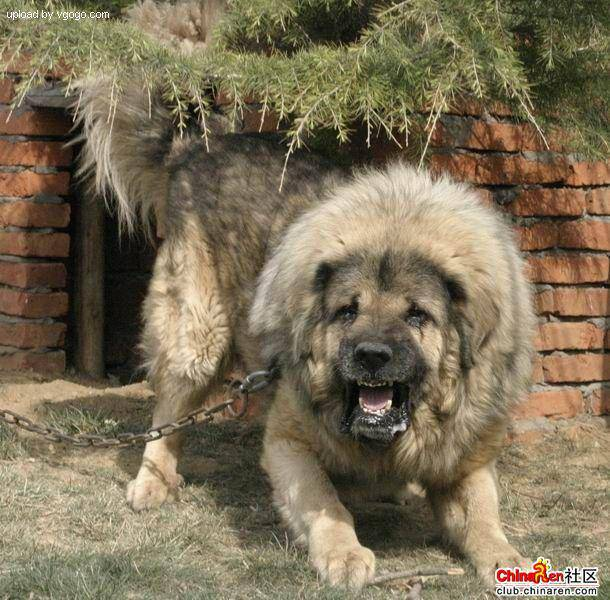

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image filepaths in a list , lets prepare our labels.

In [ ]:
import numpy as np

labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# See if number match the number of labels

if len(labels)==len(filenames):
   print("No of labels matches number of filenames")

else :
  print("No of labels does not match number of filenames")

No of labels matches number of filenames


In [ ]:
# Find the unique value labels

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into a array of booleans

print(labels[0])

labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean arrays

boolean_labels = [label == unique_breeds for label in labels]

boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example : Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where labels occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

Since the data from kaggle does not contain validation set , we will create our own

In [ ]:
# Setup X and y variables

X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

### We are going to work with ~1000 images and increase as we need

In [ ]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Jitne bhi hyperparameters hote hein tensorflow mein unka naming convention capital hota hein , for example the above one

In [ ]:
# Lets split our data into train and validation sets

from sklearn.model_selection import train_test_split


X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES],
                                                     y[:NUM_IMAGES],
                                                     test_size=0.2,
                                                     random_state=42)

len(X_train) , len(y_train) , len(X_val) , len(y_val)

(800, 800, 200, 200)

In [ ]:
# Lets have geez at the training data

X_train[:2] , y_train[:2]

(['drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into tensors)

To Preprocess our images into tensor's we are going to write a function which does a few things:

* Take an image filepath as input
* Use Tensorflow to read the file and save it to a variable , `image`
* Turn our `image` (a jpg) into tensors
* Normalize our `image`(convert color channels values from 0-255 to 0-1)
* Resize the `image` to be a shape of (224 ,224)
* Return the modified `image`

Before we start lets see what importing a image looks like

In [ ]:
from matplotlib.pyplot import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# (height , width , color channel(usually rgb(red green and blue)))

# color channel:represented as rgb values ranging from 0 to 255

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max() , image.min()

(255, 0)

In [ ]:
# Turn image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
# tensors mein convert karna bhi same hota hein as in numpy bas ismein convert karte hein yeh aur tej compute hoga GPU mein

Now we have seen how an image looks like as a tensor , lets make a function to preprocess them .


* Take an `image` filepath as input
* Use Tensorflow to read the file and save it variable  `image`      
* Turn our `image` (a jpg) into tensors
* Normalize our `image`(convert color channels values from 0-255 to 0-1)
* Resize the `image` to be a shape of (224 ,224)
* Return the modified `image`










In [ ]:
# define the image size

IMG_SIZE = 224
import tensorflow as tf


# Create a function to preprocess the images


def preprocess_image(image_path , img_size = IMG_SIZE):
     """
     Takes an image as a file path and turns the image into Tensor
     """
     # read in image file
     image = tf.io.read_file(image_path) # tensor return karta hein yeh in the form of string

     # turn the jpg image into numerical Tensors with three color channels (red blue green)

     image = tf.image.decode_jpeg(image , channels =3)
     # convert the color channels values from 0-255 to 0-1 values
     image = tf.image.convert_image_dtype(image , tf.float32)
     # isse normalisation kehthe hein . computation easy hojata hein jab hum apne values ko 0-255 se leke
     # 0-1 mein le aate hein

     # Resize the image to our desired value(224 , 224)
     image  = tf.image.resize(image , size=[IMG_SIZE , IMG_SIZE] )

     return image

In [ ]:
tensor  = tf.io.read_file(filenames[42])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor.shape

TensorShape([])

In [ ]:
tensor = tf.image.decode_jpeg(tensor , channels =3)

In [ ]:
tf.image.convert_image_dtype(tensor , tf.float32)

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

# Turning our tensors into batches

Why turn our data into batches

Lets say we are using 10000+ images in one go... they all might not fit into the memory.

So that's why we do about 32 (batch size) images at a time ( we can manually adjust the batch size if needed)

In order to use Tensorflow effectively , we need our data in the form Tensor tuples which looks like this:

`(image , label)`

In [ ]:
# Create a function to return a tuple (image , label)

def get_image_label(image_path , label):
    """
    Takes an image file path name and the label associated
    with it , preprocess the image and returns the tuple of (image , label)
    """

    image = preprocess_image(image_path)
    return image , label

In [ ]:
# Demo of the above

(preprocess_image(X[24]),tf.constant(y[24]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.        , 0.02205882, 0.0004902 ],
         [0.00205707, 0.03686975, 0.00378151],
         [0.00747549, 0.04903712, 0.01661415],
         ...,
         [0.02267136, 0.07724071, 0.03515386],
         [0.04925642, 0.09582529, 0.05936681],
         [0.00441176, 0.02794118, 0.00588235]],
 
        [[0.        , 0.03921569, 0.00539216],
         [0.02015932, 0.06678046, 0.03295694],
         [0.04519433, 0.08964461, 0.05761555],
         ...,
         [0.08460237, 0.14753135, 0.1039739 ],
         [0.10557685, 0.16096902, 0.12028274],
         [0.02205882, 0.07745098, 0.03676471]],
 
        [[0.        , 0.03921569, 0.00784314],
         [0.02633053, 0.06883754, 0.03746499],
         [0.05254727, 0.09568454, 0.06431198],
         ...,
         [0.08066337, 0.1504638 , 0.10379888],
         [0.08968931, 0.15733637, 0.11174814],
         [0.        , 0.06764706, 0.02205883]],
 
        ...,
 
        [[0.00490196, 0.02009804

Now we have got our data into tuples of Tensors in the form of (`image`,`label`) , lets make a function to Turn
all our data(`X`,`y`) into batches

In [ ]:
# Define the batch size , 32 is a good start
import tensorflow as tf

BATCH_SIZE = 32

# Create a function to turn data into batches

def create_data_batches(X,y=None , batch_size = BATCH_SIZE , valid_data = False , test_data = False):
    """
    Create batches of data out of image (X) and label (y) pairs
    Shuffles the data if it is training data but doesnt shuffle if it is validation data
    Also accepts test data as inputs(no labels) iske liye humne default y = None karke rakha hein
    agar test data valaa case aa jaye to
    """

    # If the data is a test dataset , we probably dont have labels

    if test_data:
      print("Creating test data batches ....")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only X no labels
      data_batch  = data.map(preprocess_image).batch(BATCH_SIZE)
      return data_batch

    elif valid_data:
      print("Creating validation data batches ....")
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath names
                                                 tf.constant(y)) # labels
                                                )
      data_batch = data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch

    else:
      print("Creating training data batches...")
      # Turn filepaths and labels into tensors
      data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepath names
                                                tf.constant(y))  # labels
                                                )
      # Shuffling pathnames and labels before mapping image preprocessor function is faster than shuffling
      #images

      data = data.shuffle(buffer_size = len(X))

      # Create (image, label) tuples (this also turns the image path into a preprocessed image)

      data = data.map(get_image_label)

      # Turn the training data into batches

      data_batch = data.batch(BATCH_SIZE)

      return data_batch


In [ ]:
# Create training and validation batches

train_data = create_data_batches(X_train , y_train)
val_data = create_data_batches(X_val , y_val, valid_data=True)

Creating training data batches...
Creating validation data batches ....


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing data batches

Our data is now in batches , but it is hard to understand , so we will write a function to visualize them


In [ ]:
import matplotlib.pyplot as plt


# Create a function for viewing images in a dat batch

def show_25_images(images , labels):
    """
    Displays a plot of 25 images and their labels from the data batch
    """
    # Setup the figure
    plt.figure(figsize=(10,10))

    # Loop through 25 (for displaying images)
    for i in range(25):

        # Create subplots (5 rows , 5 columns)
        ax = plt.subplot(5,5,i+1) # (row , column , index)

        # Display an image
        plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])

        # Turn the grid lines off
        plt.axis("off")



In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())
len(train_images) , len(train_labels)

(32, 32)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

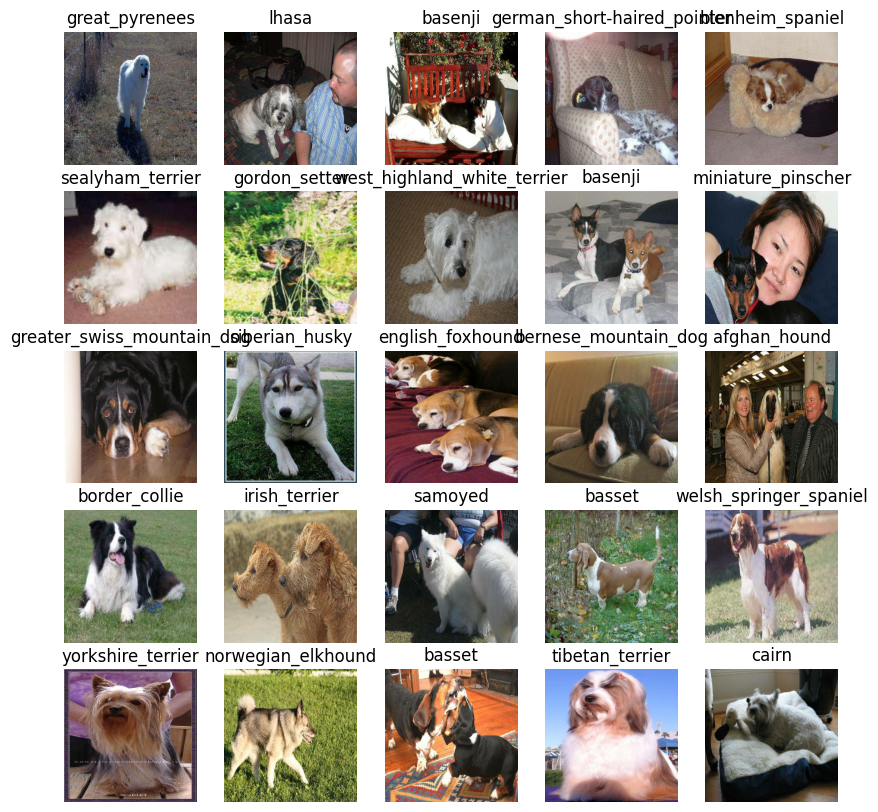

In [ ]:
# Now lets visualize our images
train_images , train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images , train_labels)

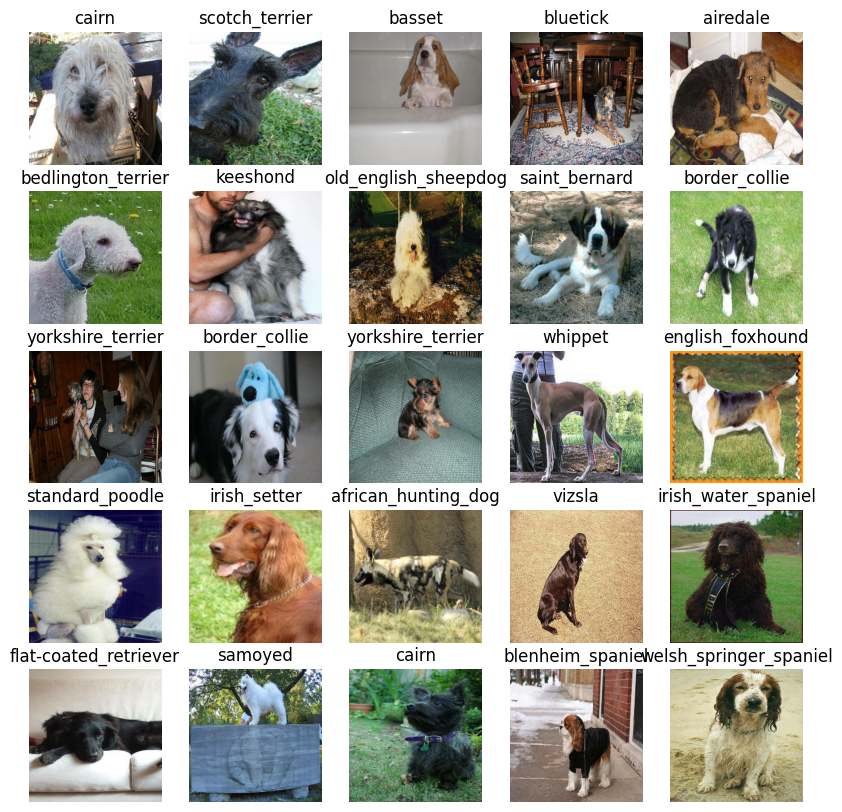

In [ ]:
# Now lets visualize our validation set

val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

## Building the model

* the input shape(our images shape in the form of tensors) to our model
* the output shape(our labels shape in the form of tensors) to our model
* The URL of the model we want to use
We will get the url from tensorflow hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model

INPUT_SHAPE = [None,IMG_SIZE, IMG_SIZE , 3] # batch , height , width , color channels

# Setup the output shape of the model

OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from tensorflow

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we got our inputs , outputs and model ready to go.
Let's put them together in a deep learning model !

Let's create  a function which:

* Takes the input shape , output shape and the model we have chosen as parameters

* Define the layers in a Keras model in sequential fashion (do this first ,then this , then that)

* Compiles the model (says it should be evaluated and improved)

* Builds the model (tells the model the input shape it will be getting ).

* Returns the model






In [ ]:
# Create a function which builds a keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE , model_url = MODEL_URL):
  print("Building model with :",MODEL_URL)

  # Setup the model layers

  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL) ,
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, # Layer 1  (input layer)
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Complie the model

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callback's are helper functions a model can use during training such to do such as things as it progress , check its progress or stop training
early if a model stops improving.

We will create two callbacks one for Tensorboard which helps track our models progress and another for early stopping which prevents our model from training too long .

### Tensorboard Callback

1. Load the Tensorboard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to the directory and pass it our model's `fit` function .✅
3. Visualize our models training logs with the `%tensorboard` magic function (we will do this after model training)

In [ ]:
# Load Tensorboard notebook extension

%load_ext tensorboard

In [ ]:
!rm -rf drive/MyDrive/dog\ vision/logs

In [ ]:
import datetime

 # Create a function to build a Tensorflow callback

def create_tensorboard_callback():
     # Create a log directory for creating TensorBoard logs
    #  logdir = os.path.join("drive/MyDrive/dog vision/logs",
    #                       # Make it so the logs get tracked whenever we run an experiment
    #                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    #                       )

     logdir = "drive/MyDrive/dog vision/logs/"+  datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
     return tf.keras.callbacks.TensorBoard(logdir)


## Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evalaution metrics stops
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create a early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training our model on a subset of data

Our first model is only going to train on 1000 images , to ensure everything is working .

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10 , max:100,step:100}

In [ ]:
# Making sure if we are still working on a GPU

print("GPU","available Yess" if tf.config.list_physical_devices("GPU") else "Not Avilable")


GPU available Yess


Lets create a function which trains our model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `call_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data , validation data , number of epochs to train for `NUM_EPOCHS` and the callbacks we would like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and return the trained version
  """

  # Create a model
  model = create_model()

  # Create a tensorboard everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard , early_stopping])
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data

model = train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 16s 149ms/step - loss: 4.5983 - accuracy: 0.0913 - val_loss: 3.5510 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 4s 142ms/step - loss: 1.6433 - accuracy: 0.6888 - val_loss: 2.3049 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 115ms/step - loss: 0.5789 - accuracy: 0.9250 - val_loss: 1.7553 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2654 - accuracy: 0.9837 - val_loss: 1.5671 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1503 - accuracy: 0.9987 - val_loss: 1.4791 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 162ms/step - loss: 0.1030 - accuracy: 1.0000 - val_loss: 1.4310 - val_accuracy: 0.6300
Epoch 7/100
25/25 [============================

## Checking the Tensorboard Logs

The Tensorboard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize its content

In [ ]:
!kill 10570

/bin/bash: line 0: kill: (10570) - No such process


In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vison/logs

Reusing TensorBoard on port 6006 (pid 5344), started 0:02:11 ago. (Use '!kill 5344' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

# Making and evaluating predictions using  a trained model

In [ ]:
# Making predictions on the validation data(not on the data it was trained on)

predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 92ms/step


array([[3.46217857e-04, 9.12788673e-05, 3.55361658e-03, ...,
        3.76477779e-04, 2.59412645e-05, 1.45263551e-02],
       [1.67503511e-03, 2.91478151e-04, 3.48590920e-03, ...,
        1.85149285e-04, 7.52131746e-04, 8.67232302e-06],
       [4.77798449e-06, 1.22945290e-04, 1.95049797e-04, ...,
        5.94109697e-05, 9.12891937e-06, 3.84639075e-04],
       ...,
       [2.74076751e-06, 3.17183112e-05, 7.80932896e-06, ...,
        3.56631790e-05, 1.17639735e-04, 3.94286217e-05],
       [1.23349042e-03, 1.21178884e-04, 8.26370524e-05, ...,
        3.37909150e-05, 6.43627136e-05, 1.21038510e-02],
       [1.82329633e-04, 3.75743875e-05, 8.61002598e-04, ...,
        2.49889400e-03, 6.88981730e-04, 5.81985696e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0] # yeh pehle image ka prediction hein , ismien model humein saare 120 breeds ka predictions
               # de raha hein , jiska highest value uss breed ka highest possibility


array([3.46217857e-04, 9.12788673e-05, 3.55361658e-03, 5.15371612e-05,
       6.70943555e-05, 6.03242224e-05, 4.03533801e-02, 8.14275758e-04,
       3.05904287e-05, 6.55373966e-04, 7.49036088e-04, 3.96681135e-04,
       5.48180309e-04, 5.21393922e-05, 6.93008478e-05, 3.58134392e-04,
       1.52482944e-05, 3.12299669e-01, 1.94700478e-05, 2.66080588e-05,
       4.92782274e-04, 3.71835013e-05, 3.67867324e-05, 3.26518109e-03,
       2.10107610e-05, 1.36521601e-04, 1.15213133e-01, 4.17367373e-05,
       5.65467635e-05, 2.48038414e-04, 7.86981836e-04, 1.18847145e-03,
       5.41549234e-04, 4.68207363e-05, 5.81526605e-04, 2.56376434e-02,
       6.41987572e-05, 1.47759492e-04, 9.09537448e-06, 4.97848145e-04,
       4.04174346e-03, 1.45110162e-05, 5.00344831e-05, 7.43558994e-05,
       2.78033785e-05, 2.27084121e-04, 2.43857448e-05, 6.18071528e-04,
       3.17769620e-04, 1.50568056e-04, 3.47265770e-04, 5.55661754e-05,
       1.80526127e-04, 9.86002124e-05, 6.51376395e-05, 6.66201813e-05,
      

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
index = 42
print(predictions[index])
print(f"Max value (probability of predictions): {np.max(predictions[index])}")
print(f"Max Index: {np.argmax(predictions[index])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.16190986e-05 2.44510593e-04 2.88564188e-05 1.37639427e-05
 8.83362256e-04 7.43138371e-05 7.08826337e-05 9.27304151e-04
 6.04522275e-03 2.75112875e-02 6.24062959e-05 6.23138430e-06
 7.25115824e-04 8.80015723e-04 1.21657643e-03 1.68117473e-03
 2.30528349e-05 1.89446437e-04 1.42746736e-04 3.81502206e-04
 4.64454642e-05 1.13766939e-04 4.05481769e-05 2.80506592e-05
 1.64720118e-02 5.55804691e-05 3.60058730e-05 1.75796376e-05
 1.87722428e-04 1.01064261e-05 1.85425815e-05 2.57468218e-05
 2.17008244e-04 1.63392269e-05 5.45830080e-05 2.92515833e-05
 4.15817049e-05 1.50188120e-04 3.23405620e-05 3.32056999e-01
 1.34404399e-04 7.94319203e-06 3.59068788e-03 4.53348503e-06
 6.84232582e-05 6.09176423e-05 1.05756233e-04 1.48911640e-04
 9.63836501e-05 2.94001715e-04 7.28611849e-05 9.64725768e-05
 3.45060107e-04 1.06923841e-03 3.20332074e-05 1.63458649e-03
 1.08672866e-04 7.01690624e-06 1.48837105e-04 2.10031831e-05
 1.13303402e-04 1.70069907e-04 3.37604638e-06 8.00606867e-05
 5.13676903e-04 4.549625

Prediction probabilties are also called confidence levels

In [ ]:
# Turn probabilities into their respective labels (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of predicted probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our data is still in a batch dataset , we have to unbatch it to make predictions on the validation images and then compare to the validation  labels(truth labels)

In [ ]:
# Create a function to unbatch a dataset

def unbatchify(data):
  """
  Takes a batch dataset and Unbatches the dataset and returns the image and label list
  """
  images=[]
  labels=[]

  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images , labels


# Unbatchify the validation data

val_images , val_labels = unbatchify(val_data)

val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_ = []
labels_ = []

for image , label in val_data.unbatch().as_numpy_iterator():
  # print(image)
  # print(label)
  images_.append(image)
  labels_.append(label)

images_[0] , labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_[0].shape

(224, 224, 3)

In [ ]:
get_pred_label(labels_[9])

'border_collie'

In [ ]:
get_pred_label(predictions[9])

'collie'

Now we have got ways to get:

* Prediction labels
* Validation labels(truth labels)
* Validation Images

Lets make some function to make these all a bit more visualize

* Takes an array of prediction probabilities , an array of truth labels and an array of images and integers ✅

* Convert the prediction probabilities to a predicted label ✅

* PLot the predicted label, its predicted probability , the truth label and the target image on the single plot. ✅

In [ ]:
def plot_pred(prediction_probabilites , labels , images , n=1):
  """
  View the prediction , ground truth and image for sample n
  """
  pred_prob , true_label , image = prediction_probabilites[n] , labels[n] , images[n]
  # Get the pred_labels
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"

  else:
    color="red"
  # Change plot title to be predicted label , probability of prediction and truth label

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                      color=color)

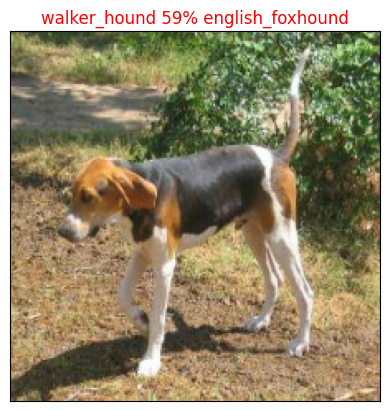

In [ ]:
plot_pred(prediction_probabilites=predictions ,
          labels = val_labels,
          images = val_images,
          n=42)

Now we have got one function to visualize our models top prediction , lets make another view our models top 10 prediction.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer✅

* Find the prediction using the `get_pred_label()`✅
* Find the top 10:✅
      
    * Prediction probabilities indices✅
    * Prediction probabilities values✅
    * Prediction labels✅

* Plot the top 10 prediction probability values and labels , coloring the true with green color ✅

In [ ]:
def plot_pred_conf(prediction_probabilites,labels , n=1):
  """
  Plots the top 10 highest prediction confidences along with the true labels
  """
  # Get the pred label
  pred_prob , true_label = prediction_probabilites[n] , labels[n]
  # Find the top 10 prediction confidences indices

  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Find the top 10 prediction labels

  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup the plot

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey"
                     )
  plt.xticks(np.arange(len(top_10_pred_labels)),
           labels = top_10_pred_labels,
           rotation="vertical")

  if np.isin(true_label , top_10_pred_labels):
     top_plot[np.argmax(true_label==top_10_pred_labels)].set_color("green")
  else:
    pass


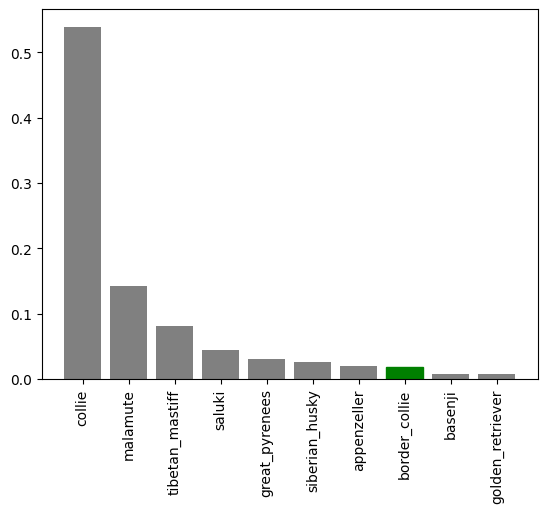

In [ ]:
plot_pred_conf(prediction_probabilites=predictions , labels = val_labels , n=9)

In [ ]:
arr = np.array([1,2,3,4])
arr.argsort()

array([0, 1, 2, 3])

In [ ]:
predictions[0]

array([3.46217857e-04, 9.12788673e-05, 3.55361658e-03, 5.15371612e-05,
       6.70943555e-05, 6.03242224e-05, 4.03533801e-02, 8.14275758e-04,
       3.05904287e-05, 6.55373966e-04, 7.49036088e-04, 3.96681135e-04,
       5.48180309e-04, 5.21393922e-05, 6.93008478e-05, 3.58134392e-04,
       1.52482944e-05, 3.12299669e-01, 1.94700478e-05, 2.66080588e-05,
       4.92782274e-04, 3.71835013e-05, 3.67867324e-05, 3.26518109e-03,
       2.10107610e-05, 1.36521601e-04, 1.15213133e-01, 4.17367373e-05,
       5.65467635e-05, 2.48038414e-04, 7.86981836e-04, 1.18847145e-03,
       5.41549234e-04, 4.68207363e-05, 5.81526605e-04, 2.56376434e-02,
       6.41987572e-05, 1.47759492e-04, 9.09537448e-06, 4.97848145e-04,
       4.04174346e-03, 1.45110162e-05, 5.00344831e-05, 7.43558994e-05,
       2.78033785e-05, 2.27084121e-04, 2.43857448e-05, 6.18071528e-04,
       3.17769620e-04, 1.50568056e-04, 3.47265770e-04, 5.55661754e-05,
       1.80526127e-04, 9.86002124e-05, 6.51376395e-05, 6.66201813e-05,
      

In [ ]:
predictions[0].argsort()

array([ 92,  38, 115,  41,  16,  18,  24,  46, 118,  19,  44, 112,   8,
        22,  21,  63,  27, 107,  33,  42,   3,  86,  13, 101,  51,  28,
        61,   5, 114,  94,  36,  54,  55,   4,  14,  43,  66,  82,   1,
        53,  99, 108,  95,  25,  88,  37,  49, 104,  74, 113,  67,  75,
        52, 111, 105,  84,  45,  78,  29,  72, 110,  48,   0,  50,  76,
        15,  69, 117,  11,  71,  91,  85,  20,  56,  39,  32,  12,  87,
        34,  47,   9,  80,  10,  30,   7,  57,  89,  96,  98,  64,  93,
        62,  31,  90, 100,  97,  58, 116,  60,  23,   2,  81,  40,  68,
        77,  79,  73, 109,  83, 119,  65,  35,  70,   6, 106, 103, 102,
        59,  26,  17])

In [ ]:
predictions[0].max() , predictions[0].argmax()

(0.31229967, 17)

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 17,  26,  59, 102, 103, 106,   6,  70,  35,  65])

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'cairn', 'irish_wolfhound', 'silky_terrier',
       'soft-coated_wheaten_terrier', 'standard_schnauzer',
       'australian_terrier', 'lhasa', 'dandie_dinmont', 'komondor'],
      dtype=object)

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.31229967, 0.11521313, 0.11491959, 0.10636842, 0.06653565,
       0.0483396 , 0.04035338, 0.03770879, 0.02563764, 0.01552479],
      dtype=float32)

Now we got some functions to help us visualize our predictions and evaluate our model , lets check out a few

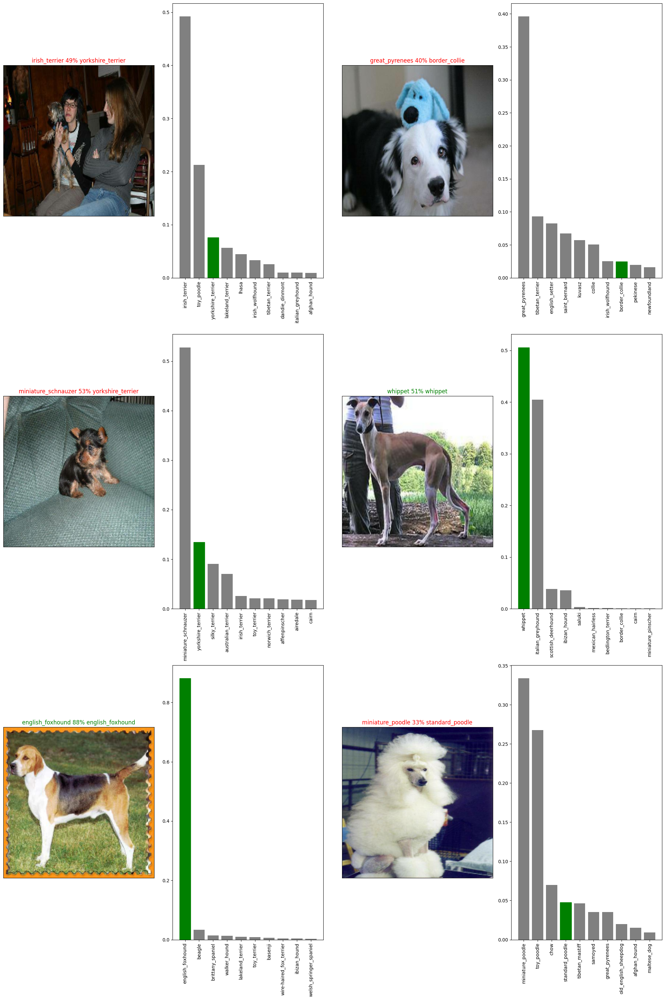

In [ ]:
# Lets checkout a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols , 10*num_rows))

for i in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_pred(prediction_probabilites=predictions ,
            labels=val_labels ,
            images = val_images ,
            n= i+ i_multiplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilites=predictions ,
            labels=val_labels ,
            n= i+ i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and loading a model

In [ ]:
# Create a function to save a model

def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """

  # Create a model directory pathname with current time

  modeldir = os.path.join("drive/MyDrive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m&d-%H%M%s"))

  model_path = modeldir+ "-" + suffix + ".h5" # save format for model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model and from a specified path
  """

  print(f"Loading saved model from :{save_model}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})

  return model


## Now we have got functions to save and load a model , lets try to check if it works or not

In [ ]:
# save our model trained 0n 100 images

save_model(model , suffix="1000-images-mobilenetv2-Adam")
# suffix is just a to indicate ourself what type of model we used or how many images we used it to train
# Its just used for communication

Saving model to: drive/MyDrive/dog vision/models/202306&d-09241685697890-1000-images-mobilenetv2-Adam.h5


'drive/MyDrive/dog vision/models/202306&d-09241685697890-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Loading saved model

loaded_1000_images_model = load_model("drive/MyDrive/dog vision/models/202305&d-11161684322202-1000-images-mobilenetv2-Adam.h5")


Loading saved model from :<function save_model at 0x7feb24e52d40>


In [ ]:

# Evaluae the pre saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.2887 - accuracy: 0.6600


[1.2886962890625, 0.6600000262260437]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 82ms/step - loss: 1.2276 - accuracy: 0.6850


[1.2275928258895874, 0.6850000023841858]

## Training a big dog model 🐶 (on the full data)

In [ ]:
## Create a databatch with full dataset

full_data  = create_data_batches(X,y)


In [ ]:
full_data

In [ ]:
full_model = create_model()

In [ ]:
# Create full model callbacks

full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data , so we cant monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
# Fit the full model to the full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3465s 11s/step - loss: 1.3538 - accuracy: 0.6691
Epoch 2/100
320/320 [==============================] - 39s 121ms/step - loss: 0.3976 - accuracy: 0.8855
Epoch 3/100
320/320 [==============================] - 37s 115ms/step - loss: 0.2378 - accuracy: 0.9379
Epoch 4/100
320/320 [==============================] - 37s 116ms/step - loss: 0.1532 - accuracy: 0.9652
Epoch 5/100
320/320 [==============================] - 38s 120ms/step - loss: 0.1085 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0758 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0589 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 36s 112ms/step - loss: 0.0462 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 37s 114ms/step - loss: 0.0370 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 37s 115m

In [ ]:
save_model(full_model , suffix="full-image-set-mobilentev2-Adam")

NameError: ignored

In [ ]:
loaded_full_model = load_model("drive/MyDrive/dog vision/models/202305&d-05521684389166-full-image-set-mobilentev2-Adam.h5")

Loading saved model from :<function save_model at 0x7feb24e52d40>


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches , to make predictions on the test data , we will
have to get in into the same format

To make predictions on the test data we will:

* Get the test image filenames ✅
* Convert the filenames into test data batches using
`create_data_batches()` and setting the `test_data` parameter `True` (since the test data doesnt have labels) ✅

* Make a predictions array by passing the test batches to the `predict()` method called on our model

In [ ]:
# Load test image filenames

test_path  = "drive/MyDrive/dog vision/test/"
test_filenames = [test_path + filename for filename in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog vision/test/dd7bf84df93991b7c15ec739c82acc04.jpg',
 'drive/MyDrive/dog vision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/dog vision/test/dfe02d52ca281aaca6215a42fee6245c.jpg',
 'drive/MyDrive/dog vision/test/de9fc145601771b7a5b7e68822416fb5.jpg',
 'drive/MyDrive/dog vision/test/e55d2fced9eb7e46aef5bdb288145fa4.jpg',
 'drive/MyDrive/dog vision/test/e1dd78810048dc387573f2ec50e4bb16.jpg',
 'drive/MyDrive/dog vision/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/dog vision/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 'drive/MyDrive/dog vision/test/e137b0cd96051765c349377725c4696d.jpg',
 'drive/MyDrive/dog vision/test/e090f0f0ebc83ddf5f649a841493868b.jpg']

In [ ]:
# Create test data batches

test_data = create_data_batches(test_filenames , test_data = True)

Creating test data batches ....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the test data batch using the loaded full model

test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 148s 444ms/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)

np.savetxt("drive/MyDrive/dog vision/preds_array.csv",test_predictions , delimiter =",")


In [ ]:
# Load predictions (Numpy array ) from csv file
import numpy as np

test_predictions = np.loadtxt("drive/MyDrive/dog vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[9.99920726e-01, 4.07133806e-11, 7.37550743e-10, ...,
        4.47188224e-11, 4.42119585e-09, 7.52514495e-08],
       [6.15144558e-09, 5.93871174e-10, 5.18931529e-08, ...,
        5.32833452e-04, 9.36968263e-08, 5.26761085e-07],
       [3.34128202e-07, 7.13523962e-10, 8.79816553e-10, ...,
        1.75140277e-10, 4.78344309e-10, 7.26985903e-08],
       ...,
       [2.65867811e-06, 3.02649255e-07, 5.19294403e-08, ...,
        2.78148651e-08, 5.95140409e-05, 5.57228077e-07],
       [8.28424618e-09, 4.34196977e-07, 1.40810627e-07, ...,
        1.78663981e-08, 2.63957423e-04, 7.95327082e-07],
       [4.56796580e-11, 1.31211033e-08, 9.31195621e-10, ...,
        6.79723314e-07, 6.31929606e-06, 5.58216473e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset for Kaggle

* Create a pandas dataframe with an id column as well as a column for each dog breed ✅
* Add data to the id column by extracting the test images id's from the filepaths ✅
* Add data (prediction probabilties) to each of the dog breed ✅
* Export the dataframe as a csv and submit to the kaggle

In [ ]:
pd.DataFrame(test_predictions)

,0,1,2,3,4,5,6,7,8,9,...,110,111,112,113,114,115,116,117,118,119
0,9.999207e-01,4.071338e-11,7.375507e-10,6.660007e-12,9.119781e-12,6.700346e-12,2.546516e-10,2.069685e-12,3.315014e-12,3.083863e-12,...,9.893061e-10,2.371098e-10,5.668526e-11,5.994713e-10,5.196506e-11,1.119320e-11,4.181981e-11,4.471882e-11,4.421196e-09,7.525145e-08
1,6.151446e-09,5.938712e-10,5.189315e-08,5.415914e-08,6.958654e-01,5.234833e-09,5.366198e-06,2.447095e-02,5.303514e-04,1.564916e-03,...,1.043365e-05,4.063110e-07,1.831702e-05,1.642898e-07,9.212516e-06,2.167595e-07,4.391993e-08,5.328335e-04,9.369683e-08,5.267611e-07
2,3.341282e-07,7.135240e-10,8.798166e-10,1.292473e-09,5.467612e-08,2.482183e-12,1.347845e-06,5.383037e-09,2.259141e-07,7.645926e-08,...,6.088494e-05,2.581668e-08,5.451884e-09,2.719035e-09,7.685438e-10,1.265788e-09,1.100241e-07,1.751403e-10,4.783443e-10,7.269859e-08
3,2.113678e-12,7.458358e-09,4.619478e-13,5.754585e-09,2.364554e-08,2.605398e-08,2.577182e-08,1.246290e-06,1.300112e-06,5.416698e-07,...,6.889764e-10,4.134343e-11,1.386079e-05,3.261546e-05,2.024935e-07,2.642482e-07,8.410613e-13,4.427015e-08,1.590159e-08,6.760255e-10
4,8.257375e-10,5.750756e-08,3.062596e-09,1.122566e-08,1.670809e-09,1.380000e-07,4.591245e-09,1.489619e-08,9.311108e-11,9.806693e-11,...,4.048839e-09,3.290820e-07,2.090499e-08,5.167986e-09,1.778452e-09,6.747554e-09,4.101437e-09,9.998998e-09,6.757049e-08,4.269477e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,3.388202e-07,4.204870e-06,1.572283e-03,2.572609e-06,1.996557e-05,4.142712e-06,6.145381e-06,1.971770e-06,3.967183e-05,1.198432e-09,...,2.109580e-06,1.306632e-05,2.918973e-02,5.510355e-06,1.272263e-03,6.367774e-04,3.888603e-09,1.322159e-03,7.334640e-06,1.719487e-05
10353,2.893560e-09,8.891087e-10,1.157182e-09,6.097639e-06,1.688906e-09,8.261279e-08,9.794429e-01,1.118678e-08,7.403260e-11,1.592197e-07,...,2.700212e-10,1.012372e-04,1.033050e-08,7.910299e-09,8.873074e-11,5.400934e-09,2.994102e-07,3.277718e-10,1.724299e-04,2.860289e-06
10354,2.761395e-12,9.590121e-11,1.617430e-09,2.149236e-08,2.981312e-07,1.509415e-09,3.151148e-08,5.103812e-09,9.236602e-11,1.507910e-09,...,4.313187e-10,1.456669e-08,3.317140e-04,2.312582e-07,3.700277e-07,9.399319e-12,3.173461e-10,4.351422e-09,7.225606e-08,1.167095e-10
10355,6.398063e-05,1.866326e-06,4.075370e-07,5.728050e-08,1.191126e-08,2.543455e-09,3.652031e-07,2.154065e-09,7.424076e-09,2.998715e-10,...,3.188205e-09,2.817766e-08,1.498839e-10,3.447155e-08,1.958802e-08,1.554920e-08,5.554098e-10,5.160422e-08,6.438000e-07,1.032413e-09


In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
# test_filenames[:10]
test_path

'drive/MyDrive/dog vision/test/'

In [ ]:
# Append the test images id's to the preds_df

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

test_ids[:10]


['dd7bf84df93991b7c15ec739c82acc04',
 'e66eb9532985301394e1bfb8f05206d4',
 'dfe02d52ca281aaca6215a42fee6245c',
 'de9fc145601771b7a5b7e68822416fb5',
 'e55d2fced9eb7e46aef5bdb288145fa4',
 'e1dd78810048dc387573f2ec50e4bb16',
 'deb063345bf2b6752e2fe25cad096547',
 'e29d2336a8559d96973c874c9c6c17c6',
 'e137b0cd96051765c349377725c4696d',
 'e090f0f0ebc83ddf5f649a841493868b']

In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/dog vision/test/dd7bf84df93991b7c15ec739c82acc04', '.jpg')

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e66eb9532985301394e1bfb8f05206d4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfe02d52ca281aaca6215a42fee6245c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,de9fc145601771b7a5b7e68822416fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e55d2fced9eb7e46aef5bdb288145fa4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,076d962aa496391d14bcf7dd8878a24c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08db69ad154c401de7951c11a15ebf26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,092b3603e559d05e09e226b56bf5f788,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,0820dacdc8a994a932d0bae3abd0a15b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the predictions probalities to the list of unique breeds

preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df[:10]

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dd7bf84df93991b7c15ec739c82acc04,9.999207e-01,4.071338e-11,7.375507e-10,6.660007e-12,9.119781e-12,6.700346e-12,2.546516e-10,2.069685e-12,3.315014e-12,...,9.893061e-10,2.371098e-10,5.668526e-11,5.994713e-10,5.196506e-11,1.119320e-11,4.181981e-11,4.471882e-11,4.421196e-09,7.525145e-08
1,e66eb9532985301394e1bfb8f05206d4,6.151446e-09,5.938712e-10,5.189315e-08,5.415914e-08,6.958654e-01,5.234833e-09,5.366198e-06,2.447095e-02,5.303514e-04,...,1.043365e-05,4.063110e-07,1.831702e-05,1.642898e-07,9.212516e-06,2.167595e-07,4.391993e-08,5.328335e-04,9.369683e-08,5.267611e-07
2,dfe02d52ca281aaca6215a42fee6245c,3.341282e-07,7.135240e-10,8.798166e-10,1.292473e-09,5.467612e-08,2.482183e-12,1.347845e-06,5.383037e-09,2.259141e-07,...,6.088494e-05,2.581668e-08,5.451884e-09,2.719035e-09,7.685438e-10,1.265788e-09,1.100241e-07,1.751403e-10,4.783443e-10,7.269859e-08
3,de9fc145601771b7a5b7e68822416fb5,2.113678e-12,7.458358e-09,4.619478e-13,5.754585e-09,2.364554e-08,2.605398e-08,2.577182e-08,1.246290e-06,1.300112e-06,...,6.889764e-10,4.134343e-11,1.386079e-05,3.261546e-05,2.024935e-07,2.642482e-07,8.410613e-13,4.427015e-08,1.590159e-08,6.760255e-10
4,e55d2fced9eb7e46aef5bdb288145fa4,8.257375e-10,5.750756e-08,3.062596e-09,1.122566e-08,1.670809e-09,1.380000e-07,4.591245e-09,1.489619e-08,9.311108e-11,...,4.048839e-09,3.290820e-07,2.090499e-08,5.167986e-09,1.778452e-09,6.747554e-09,4.101437e-09,9.998998e-09,6.757049e-08,4.269477e-08
5,e1dd78810048dc387573f2ec50e4bb16,3.190708e-05,7.062715e-08,2.699679e-08,1.376067e-10,1.149149e-08,5.000376e-09,6.997338e-07,4.438486e-09,3.535111e-07,...,5.537750e-04,7.796207e-07,2.484942e-07,3.528916e-09,2.248390e-08,1.060698e-11,3.603346e-07,7.056614e-08,1.486412e-06,1.772189e-06
6,deb063345bf2b6752e2fe25cad096547,1.421608e-06,8.897071e-09,8.120553e-09,9.686331e-12,6.024022e-09,1.489607e-11,1.434684e-07,1.310184e-10,3.533997e-10,...,1.404299e-06,2.186150e-06,5.592933e-09,1.241921e-09,1.334798e-09,4.648583e-11,6.060139e-07,1.546712e-10,7.980814e-07,4.354791e-06
7,e29d2336a8559d96973c874c9c6c17c6,2.658678e-06,3.026493e-07,5.192944e-08,4.893309e-10,5.703442e-08,4.400298e-12,4.954698e-08,1.061816e-07,1.219819e-07,...,4.068414e-09,2.853004e-08,2.233835e-09,3.985198e-07,1.098855e-09,1.152623e-08,1.444672e-01,2.781487e-08,5.951404e-05,5.572281e-07
8,e137b0cd96051765c349377725c4696d,8.284246e-09,4.341970e-07,1.408106e-07,5.736798e-07,6.224031e-08,9.109838e-09,4.058536e-07,5.185954e-07,8.149093e-09,...,1.671286e-07,1.537413e-07,2.206299e-07,1.405043e-08,2.251710e-09,2.603078e-08,4.378243e-08,1.786640e-08,2.639574e-04,7.953271e-07
9,e090f0f0ebc83ddf5f649a841493868b,4.567966e-11,1.312110e-08,9.311956e-10,2.530933e-09,1.430179e-08,1.497554e-08,1.427575e-07,9.478216e-09,3.023770e-04,...,1.116852e-08,1.057700e-06,5.900258e-07,4.501193e-03,3.519939e-08,8.723950e-09,1.520780e-08,6.797233e-07,6.319296e-06,5.582165e-10


In [ ]:
preds_df.to_csv("drive/MyDrive/dog vision/full_model_predictions_1_mobilenetV2.csv" , index=False)

# Making predictions on custom images

To make predictions on custom images , we will:

* Get filepath of our own images
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images wont have labels we will
set the `test_data` parameter to `True`

* Pass the custom image data batch to our models `predict()` method .

* Convert the prediction probabilities to prediction labels

* Compare the predicted labels to the custom images

In [ ]:
# Get custom image filepaths
import os
custom_path = "drive/MyDrive/dog vision/myDogs/"

custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/dog vision/myDogs/th (2).jpeg',
 'drive/MyDrive/dog vision/myDogs/th (1).jpeg',
 'drive/MyDrive/dog vision/myDogs/th.jpeg']

In [ ]:
# Turn custom images into batch dataset

custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data


Creating test data batches ....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1000ms/step


In [ ]:
custom_preds

array([[7.33046601e-09, 1.02858520e-11, 4.99772561e-08, 1.42049643e-08,
        3.43750844e-06, 1.29737771e-07, 2.95487808e-07, 3.66171989e-11,
        4.11125370e-11, 9.47429357e-11, 1.46848242e-10, 2.03258417e-11,
        1.55357469e-04, 2.59377742e-10, 3.51010740e-08, 3.29863633e-06,
        1.86240925e-08, 1.10714346e-07, 8.54913015e-11, 7.68020101e-08,
        2.26846222e-08, 1.17963211e-07, 3.62478181e-06, 8.00792233e-09,
        4.48752202e-10, 7.24204199e-08, 6.11426101e-12, 6.00105772e-12,
        4.17511110e-08, 9.17323462e-09, 1.51853485e-09, 5.36562850e-10,
        3.90247765e-11, 5.79764223e-11, 2.15265641e-06, 4.19155155e-10,
        1.11535288e-10, 4.42402920e-10, 5.12619270e-04, 7.35417549e-09,
        3.76242454e-10, 2.84015389e-12, 1.68582091e-07, 8.79213058e-09,
        1.25905092e-06, 1.55156002e-07, 2.08826751e-08, 1.30445352e-08,
        4.02936934e-10, 3.00726422e-09, 4.83934182e-09, 4.38903633e-08,
        1.36772783e-07, 1.59471927e-06, 3.37634892e-10, 1.346426

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_pred_labels

['rottweiler', 'boston_bull', 'pekinese']

In [ ]:
custom_images = []
# Loop through unbatch data

for image in custom_data.unbatch().as_numpy_iterator():
    custom_images.append(image)

custom_images

[array([[[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        ...,
 
        [[0.02427552, 0.02427552, 0.02427552],
         [0.00020633, 0.00020633, 0.00020

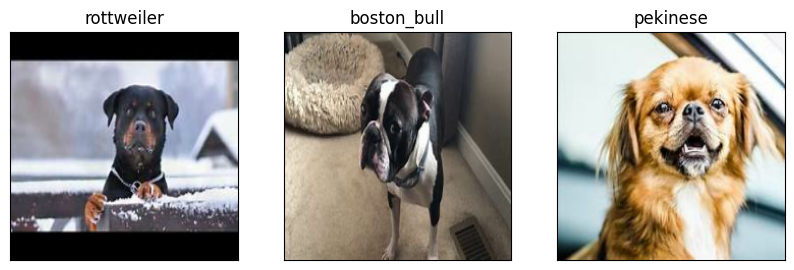

In [ ]:
# Check the custom image predictions

plt.figure(figsize=(10,10))

for i , image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)